In [145]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,VotingClassifier,StackingClassifier
from sklearn.metrics import classification_report,roc_auc_score,roc_curve,precision_score,recall_score,f1_score,accuracy_score
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

In [84]:
df=pd.read_csv('Churn_Modelling.csv')
df.head(5)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


# Describtive Analysis

In [85]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
RowNumber,10000.0,5.000500e+03,2886.895680,1.00,2500.75,5.000500e+03,7.500250e+03,10000.00
CustomerId,10000.0,1.569094e+07,71936.186123,15565701.00,15628528.25,1.569074e+07,1.575323e+07,15815690.00
CreditScore,10000.0,6.505288e+02,96.653299,350.00,584.00,6.520000e+02,7.180000e+02,850.00
Age,10000.0,3.892180e+01,10.487806,18.00,32.00,3.700000e+01,4.400000e+01,92.00
Tenure,10000.0,5.012800e+00,2.892174,0.00,3.00,5.000000e+00,7.000000e+00,10.00
Balance,10000.0,7.648589e+04,62397.405202,0.00,0.00,9.719854e+04,1.276442e+05,250898.09
NumOfProducts,10000.0,1.530200e+00,0.581654,1.00,1.00,1.000000e+00,2.000000e+00,4.00
HasCrCard,10000.0,7.055000e-01,0.455840,0.00,0.00,1.000000e+00,1.000000e+00,1.00
IsActiveMember,10000.0,5.151000e-01,0.499797,0.00,0.00,1.000000e+00,1.000000e+00,1.00
EstimatedSalary,10000.0,1.000902e+05,57510.492818,11.58,51002.11,1.001939e+05,1.493882e+05,199992.48


In [86]:
df.describe(include=object).T

,count,unique,top,freq
Surname,10000,2932,Smith,32
Geography,10000,3,France,5014
Gender,10000,2,Male,5457


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


# univariant analysis

In [88]:
df.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [91]:
df_num=df.select_dtypes(include=np.number)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


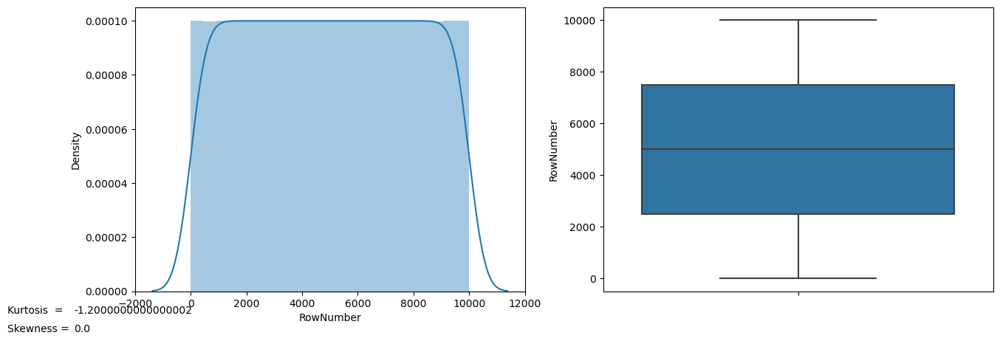

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


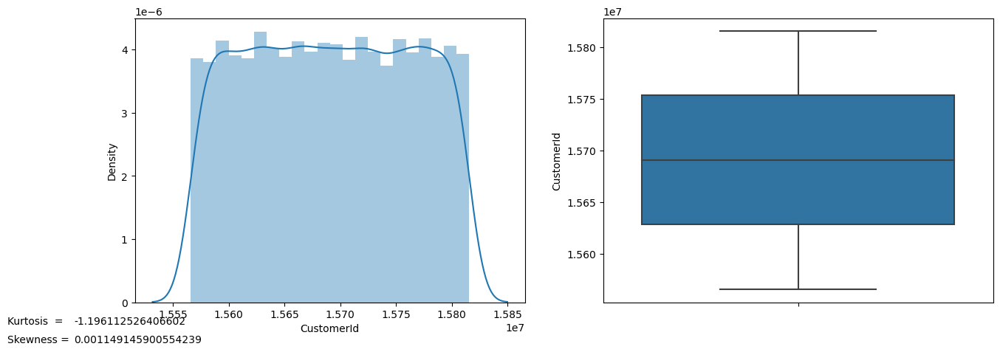

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


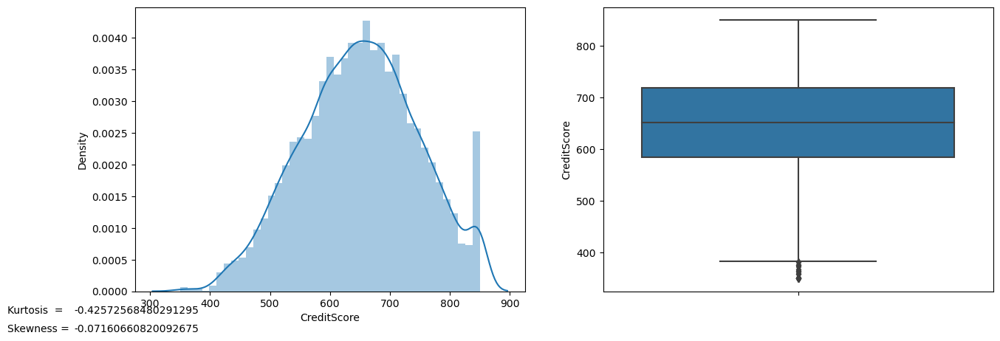

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


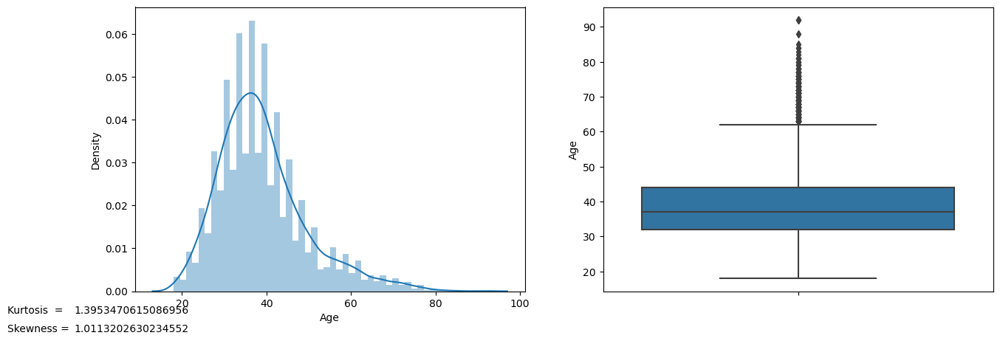

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


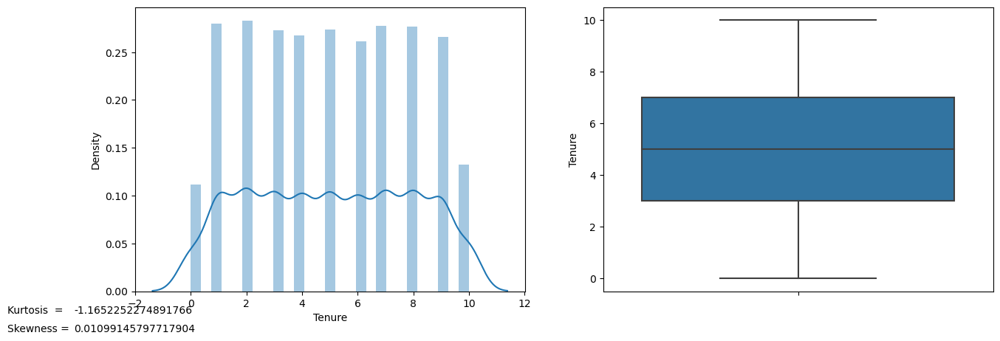

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


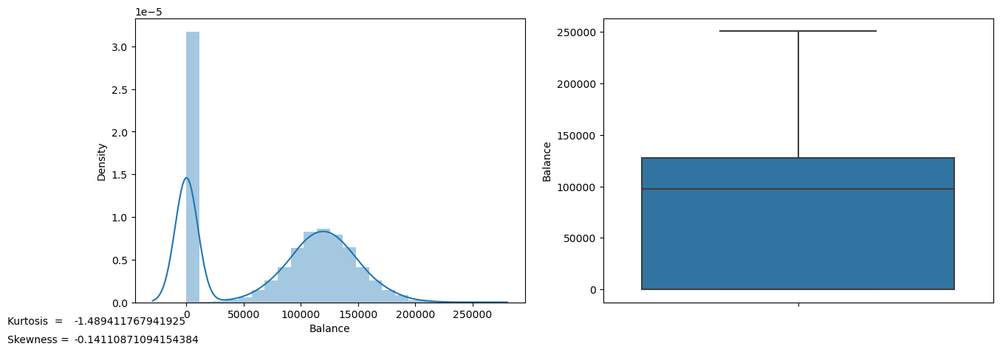

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


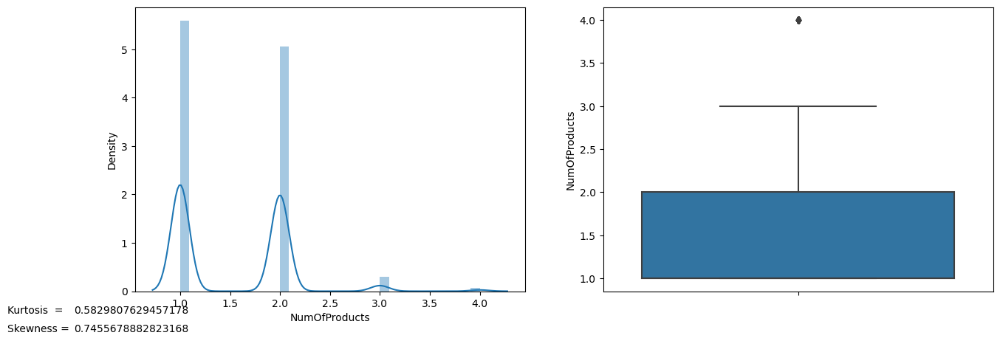

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


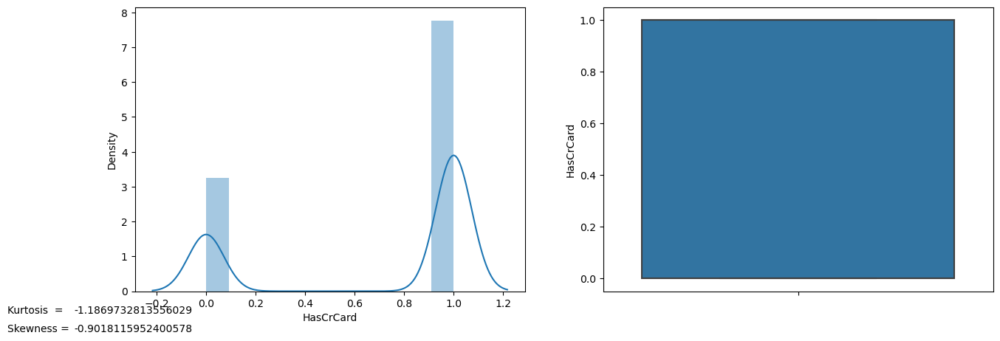

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


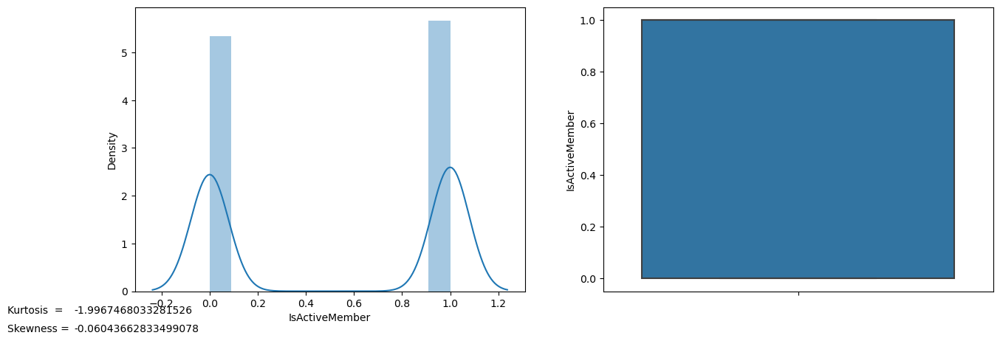

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


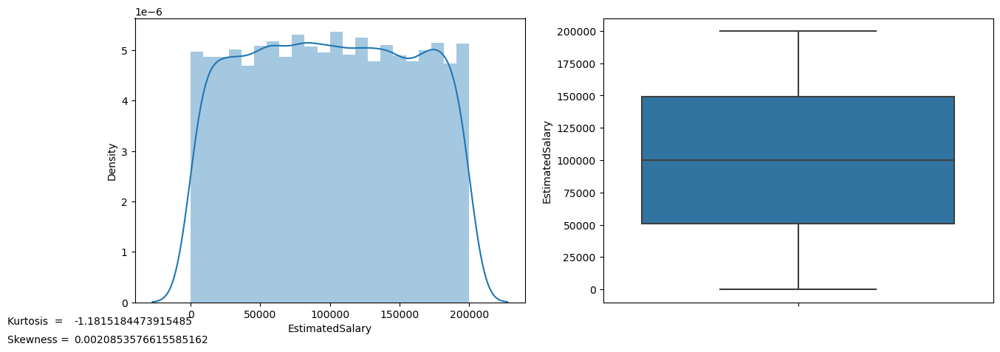

C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_8208\1521571568.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_num[i])


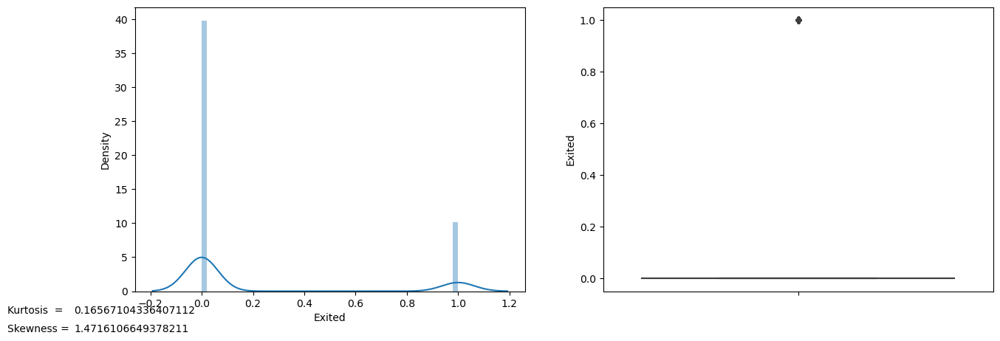

In [90]:
for i in df_num.columns:
    plt.subplots(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    sns.distplot(df_num[i])
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_num[i])
    plt.figtext(0.01,0.001, 'Skewness = ')
    plt.figtext(0.07,0.001, df_num[i].skew())
    plt.figtext(0.01,0.05, 'Kurtosis  =')
    plt.figtext(0.07,0.05, df_num[i].kurt())
    plt.show()

In [92]:
df_cat= df.select_dtypes(include="object")

Surname


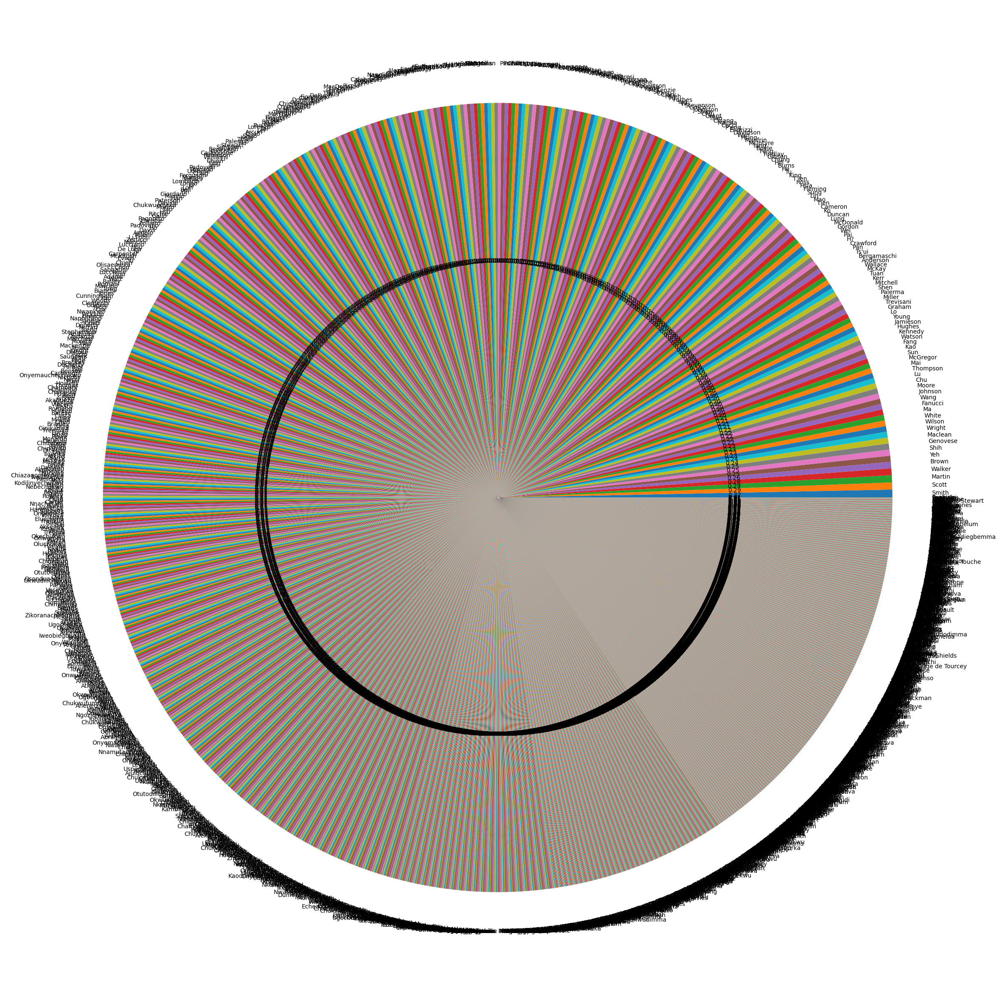

Geography


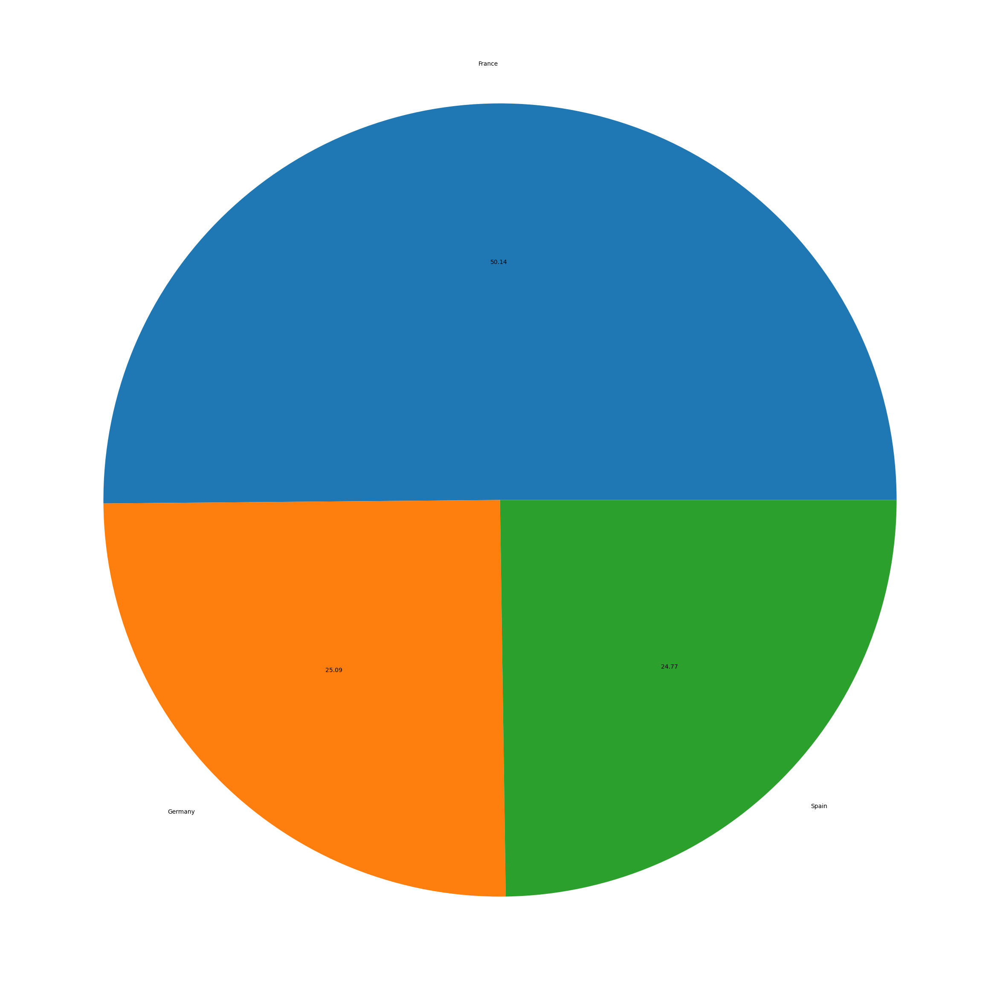

Gender


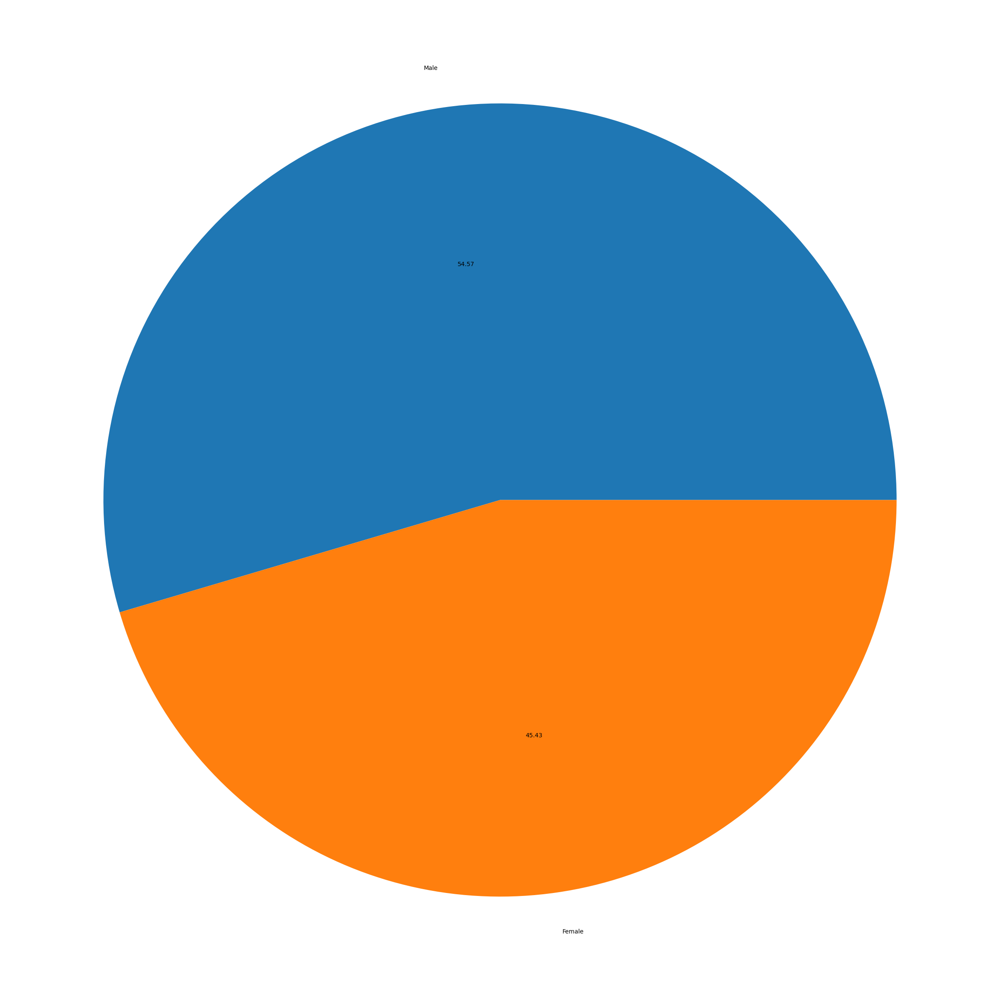

In [93]:
for i in df_cat:
    print(i)
    plt.figure(figsize=(30,40))
    z=df_cat[i].value_counts()/len(df_cat)*100
    plt.pie(z,autopct="%.2f",labels=z.index)
    plt.show()

# Bivariant Analysis

### Quant VS Quant

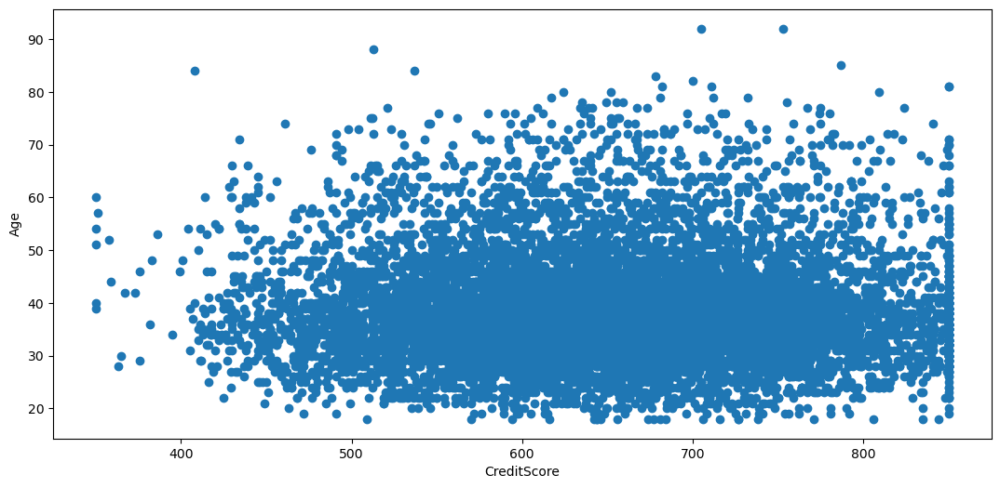

In [98]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['CreditScore'],y=df['Age'])
plt.xlabel('CreditScore')
plt.ylabel('Age')
plt.show()

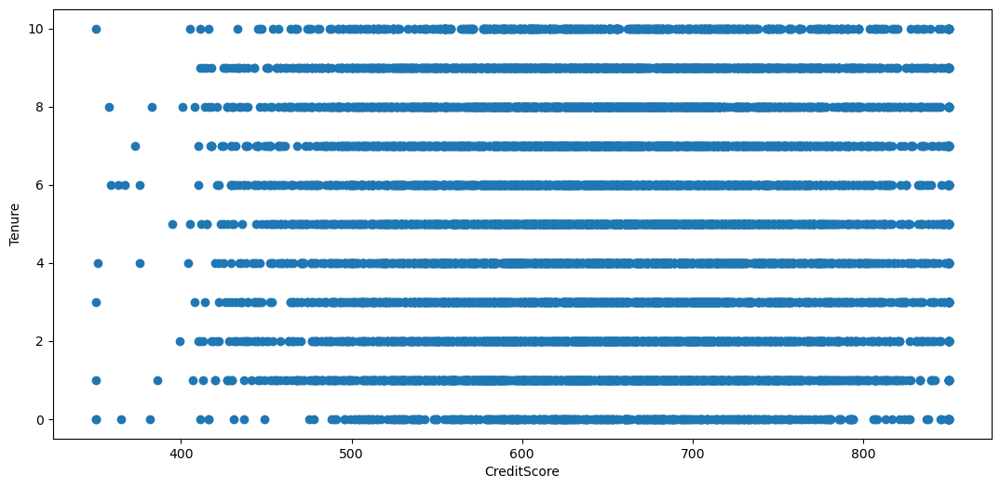

In [99]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['CreditScore'],y=df['Tenure'])
plt.xlabel('CreditScore')
plt.ylabel('Tenure')
plt.show()

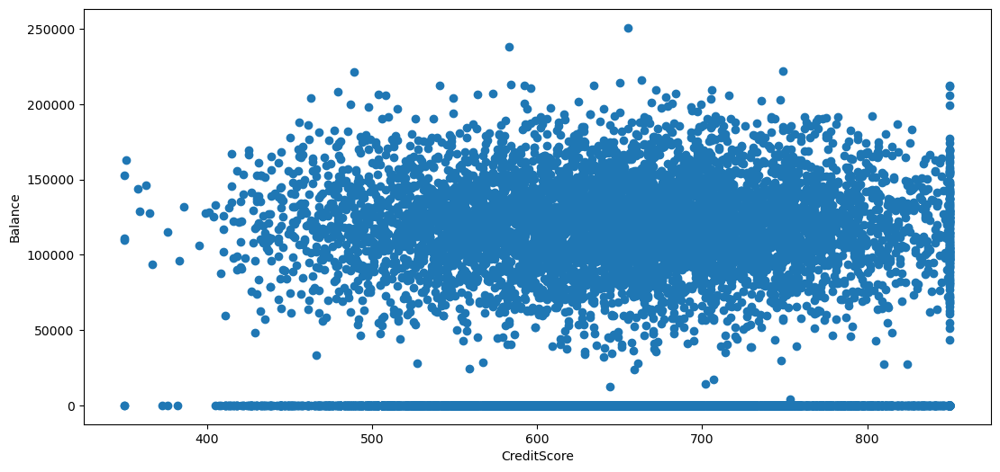

In [100]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['CreditScore'],y=df['Balance'])
plt.xlabel('CreditScore')
plt.ylabel('Balance')
plt.show()

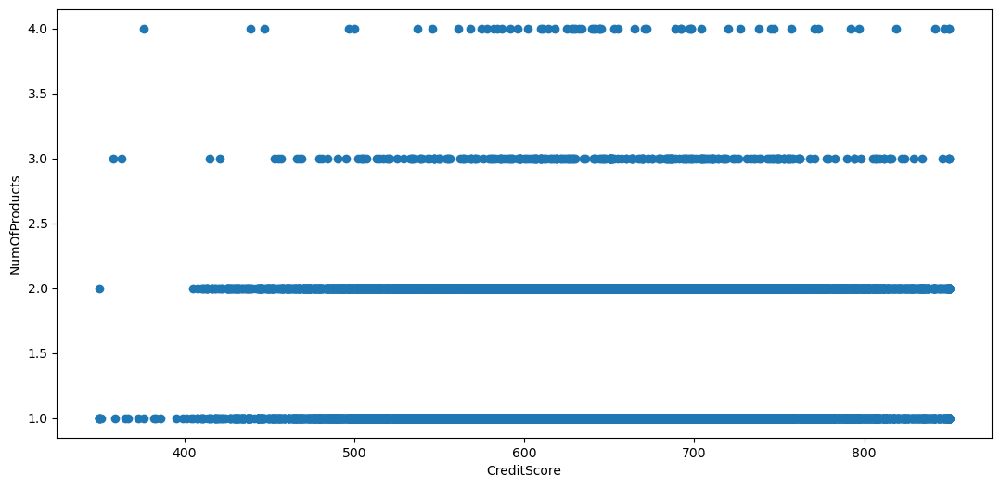

In [101]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['CreditScore'],y=df['NumOfProducts'])
plt.xlabel('CreditScore')
plt.ylabel('NumOfProducts')
plt.show()

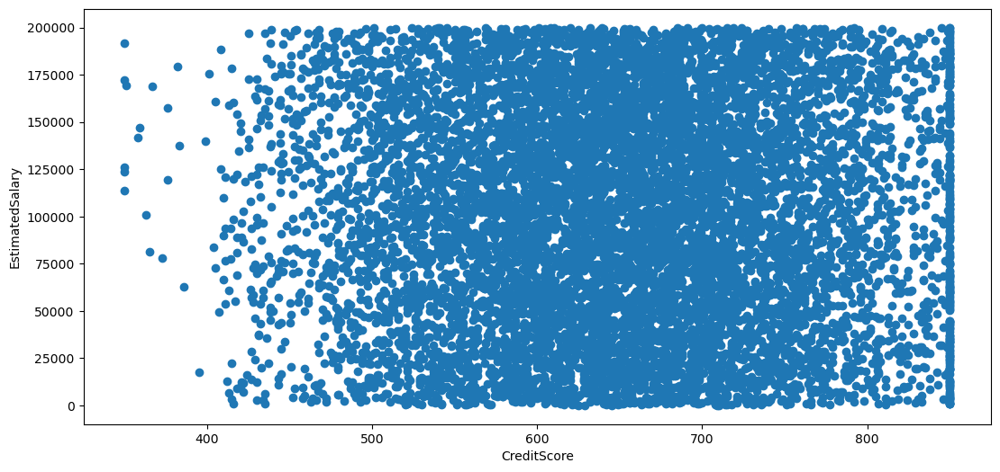

In [104]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['CreditScore'],y=df['EstimatedSalary'])
plt.xlabel('CreditScore')
plt.ylabel('EstimatedSalary')
plt.show()

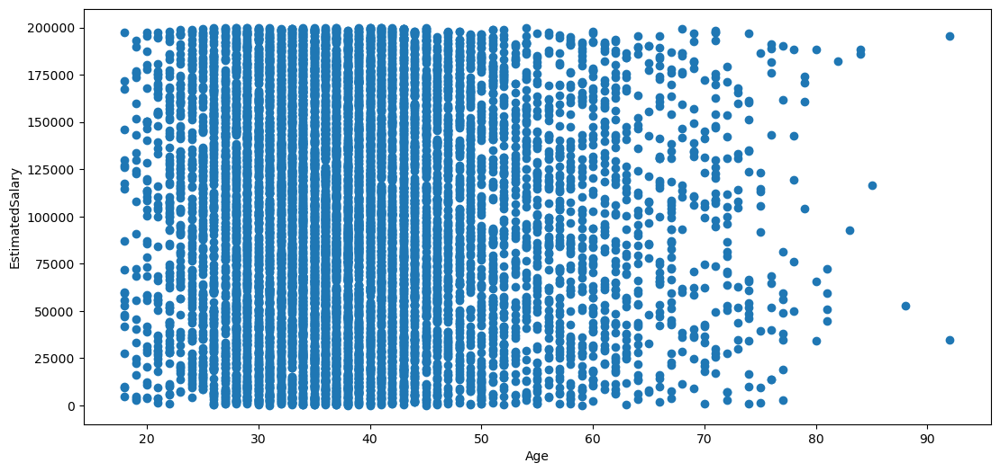

In [112]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['Age'],y=df['EstimatedSalary'])
plt.xlabel('Age')
plt.ylabel('EstimatedSalary')
plt.show()

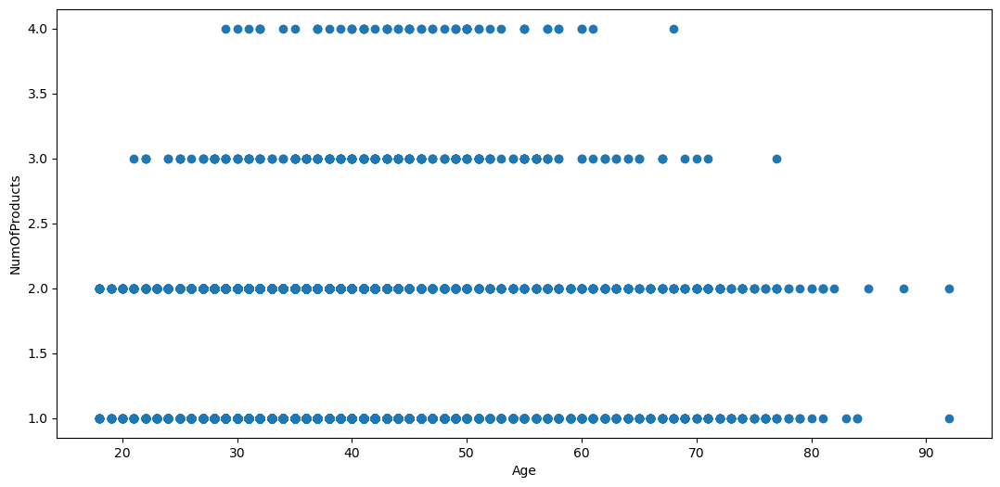

In [114]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['Age'],y=df['NumOfProducts'])
plt.xlabel('Age')
plt.ylabel('NumOfProducts')
plt.show()

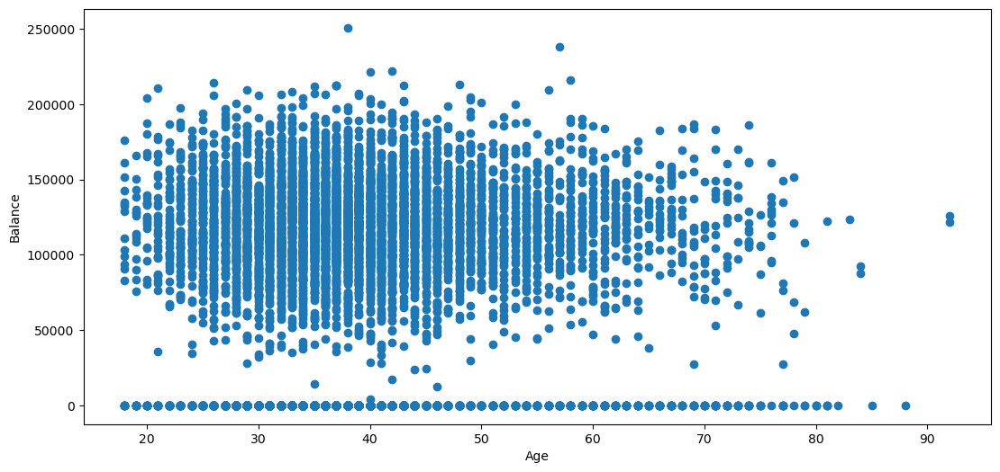

In [115]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['Age'],y=df['Balance'])
plt.xlabel('Age')
plt.ylabel('Balance')
plt.show()

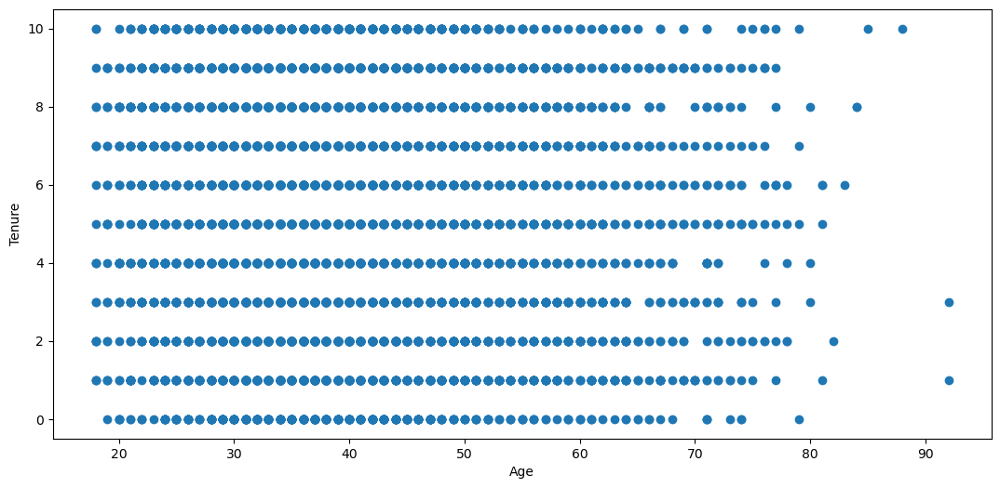

In [116]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['Age'],y=df['Tenure'])
plt.xlabel('Age')
plt.ylabel('Tenure')
plt.show()

In [117]:
df.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

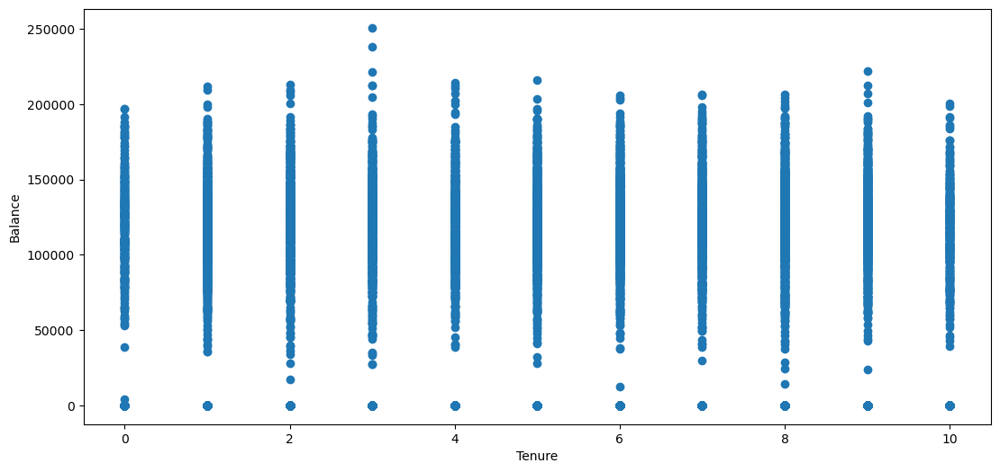

In [118]:
plt.figure(figsize=(13,6))
plt.scatter(x=df['Tenure'],y=df['Balance'])
plt.xlabel('Tenure')
plt.ylabel('Balance')
plt.show()

### Qualitative VS Qualitive

In [125]:
df_num.columns

Index(['RowNumber', 'CustomerId', 'CreditScore', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

<Axes: xlabel='Surname', ylabel='count'>

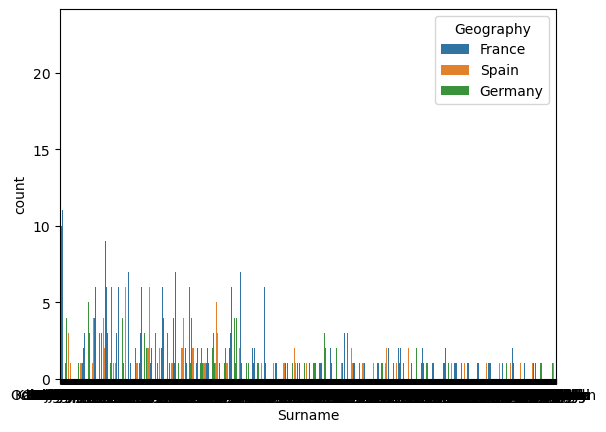

In [122]:
sns.countplot(x=df['Surname'],hue=df['Geography'])

<Axes: xlabel='Surname', ylabel='count'>

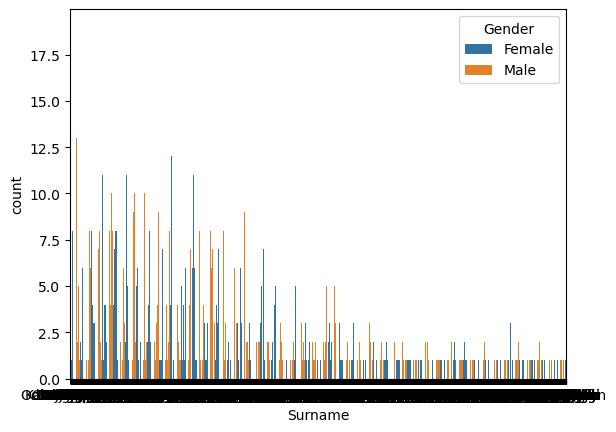

In [123]:
sns.countplot(x=df['Surname'],hue=df['Gender'])

<Axes: xlabel='Geography', ylabel='count'>

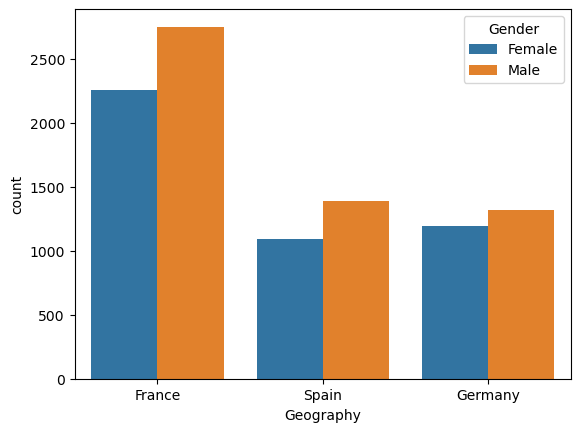

In [124]:
sns.countplot(x=df['Geography'],hue=df['Gender'])

### Quantitative VS Qualitative

<Axes: xlabel='CreditScore', ylabel='Gender'>

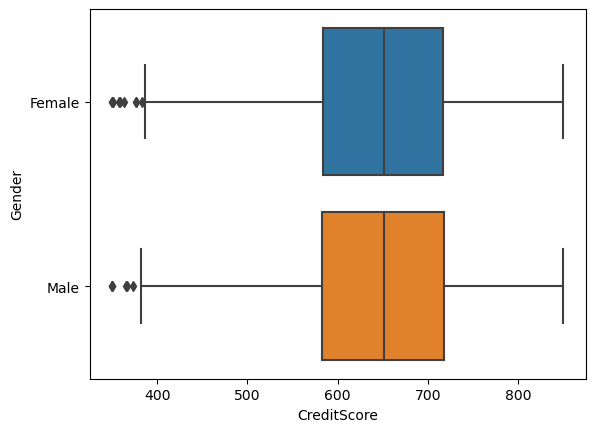

In [126]:
sns.boxplot(x=df['CreditScore'],y=df['Gender'])

<Axes: xlabel='Age', ylabel='Gender'>

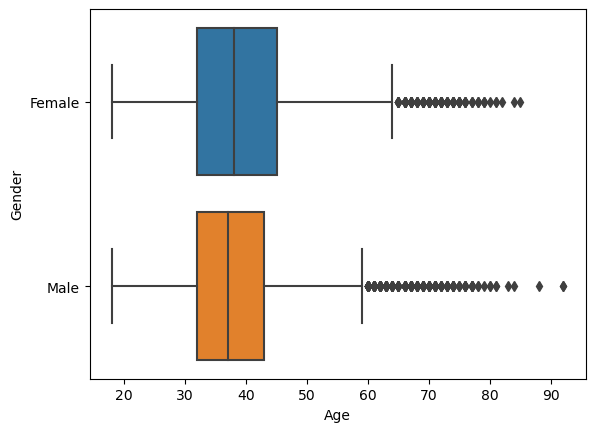

In [127]:
sns.boxplot(x=df['Age'],y=df['Gender'])

<Axes: xlabel='Tenure', ylabel='Gender'>

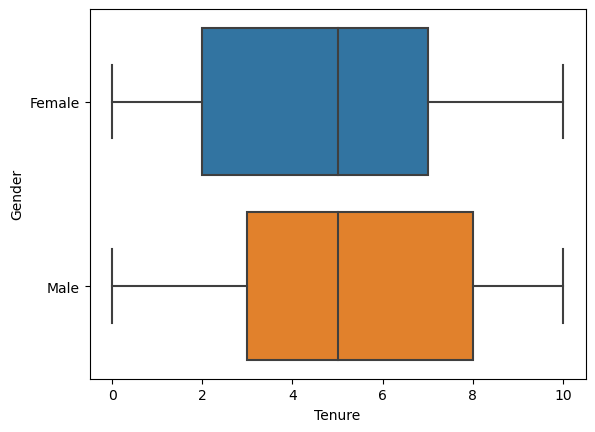

In [128]:
sns.boxplot(x=df['Tenure'],y=df['Gender'])

<Axes: xlabel='EstimatedSalary', ylabel='Gender'>

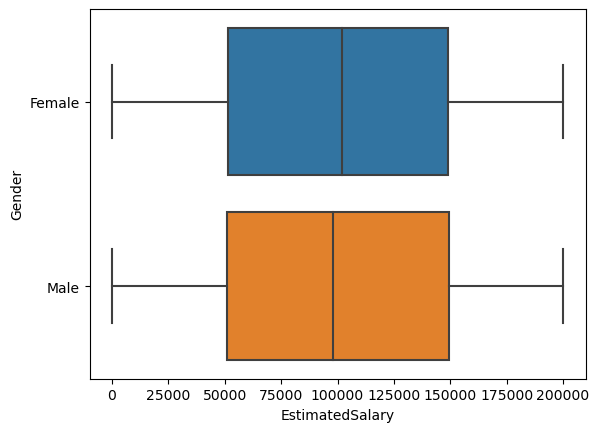

In [131]:
sns.boxplot(x=df['EstimatedSalary'],y=df['Gender'])

<Axes: xlabel='EstimatedSalary', ylabel='Geography'>

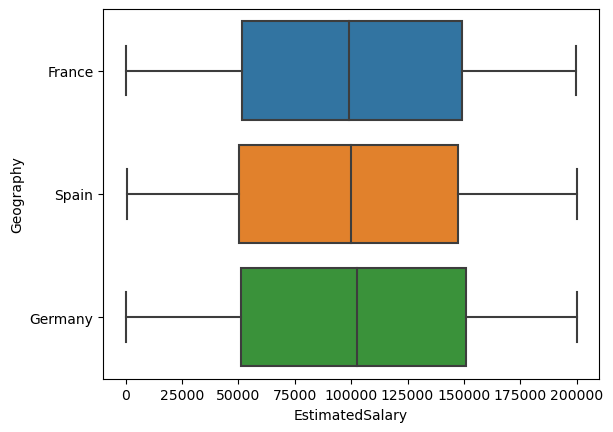

In [134]:
sns.boxplot(x=df['EstimatedSalary'],y=df['Geography'])

<Axes: xlabel='CreditScore', ylabel='Geography'>

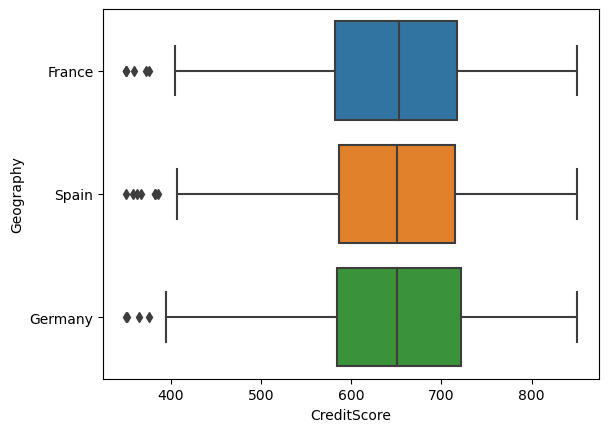

In [135]:
sns.boxplot(x=df['CreditScore'],y=df['Geography'])

<Axes: xlabel='Balance', ylabel='Geography'>

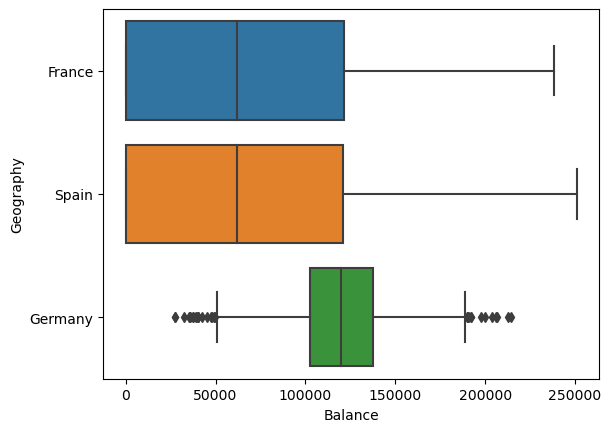

In [136]:
sns.boxplot(x=df['Balance'],y=df['Geography'])

In [139]:
df_num.columns

Index(['RowNumber', 'CustomerId', 'CreditScore', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'Exited'],
      dtype='object')

# Data Preprocessing

In [6]:
#Missig value
df.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [7]:
#there is no missing value in the data

In [8]:
#Feature Selection 

In [9]:
df.head(2)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0


In [10]:
df=df.drop(['RowNumber','CustomerId','Surname'],axis=1)

In [11]:
df.head(2)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0


In [12]:
#train test split
y=df['Exited']
x=df.drop('Exited',axis=1)

In [13]:
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.9,random_state=3,stratify=y)

In [14]:
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(9000, 10) (9000,) (1000, 10) (1000,)


In [15]:
#frequencay encoding for Geography
geo_encoding=x_train['Geography'].value_counts().to_dict()

In [16]:
x_train['Geography']=x_train['Geography'].map(geo_encoding)
x_test['Geography']=x_test['Geography'].map(geo_encoding)

In [17]:
#dummy encoding for Gender
x_train=pd.get_dummies(x_train,drop_first=True,dtype=int)

In [18]:
x_test=pd.get_dummies(x_test,drop_first=True,dtype=int)

In [19]:
x_train.shape

(9000, 10)

In [20]:
x_test.shape

(1000, 10)

# Predictive Modeling

In [35]:
accu=[]
recl=[]
prec=[]
f1=[]
model_name=[]
def model_validation(model,xtrain,ytrain,xtest,ytest):
    m= model
    m.fit(xtrain,ytrain)
    pred_h=m.predict(xtest)
    pred_s=m.predict_proba(xtest)[:,1]
    print('classification_report\n',classification_report(ytest,pred_h))
    
    fpr,tpr,thre=roc_curve(ytest,pred_s)
    plt.plot([0,1],[0,1],ls='--',color='red')
    plt.plot(fpr,tpr)
    plt.show()
    
    resp=input('Do You Want To Keep This Model? Yes')
    if resp.lower()=='yes':
        model_name.append(str(m))
        accu.append(accuracy_score(ytest,pred_h))
        recl.append(recall_score(ytest,pred_h))
        prec.append(precision_score(ytest,pred_h))
        f1.append(f1_score(ytest,pred_h))
        global df_score
        df_score=pd.DataFrame({'Model':model_name,'Accuracy':accu,
                              'Recall':recl,'Precision':prec,'F1 Score':f1})
        
        return m
    


In [36]:
#Descision Tree

classification_report
               precision    recall  f1-score   support

           0       0.87      0.96      0.91       796
           1       0.72      0.44      0.55       204

    accuracy                           0.85      1000
   macro avg       0.79      0.70      0.73      1000
weighted avg       0.84      0.85      0.84      1000



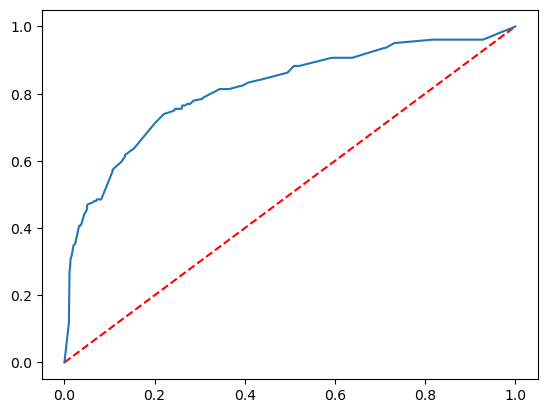

Do You Want To Keep This Model? Yesyes


In [37]:
dt=model_validation(DecisionTreeClassifier(max_depth=8),x_train,y_train,x_test,y_test)

classification_report
               precision    recall  f1-score   support

           0       0.80      0.96      0.87       796
           1       0.35      0.09      0.14       204

    accuracy                           0.78      1000
   macro avg       0.57      0.52      0.51      1000
weighted avg       0.71      0.78      0.72      1000



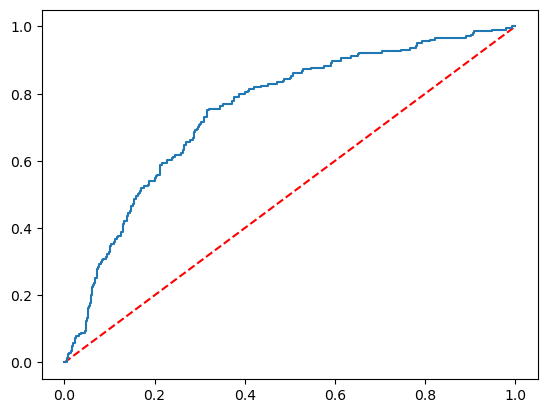

Do You Want To Keep This Model? Yesno


In [38]:
nb=model_validation(GaussianNB(),x_train,y_train,x_test,y_test)

classification_report
               precision    recall  f1-score   support

           0       0.87      0.96      0.91       796
           1       0.76      0.44      0.55       204

    accuracy                           0.86      1000
   macro avg       0.82      0.70      0.73      1000
weighted avg       0.85      0.86      0.84      1000



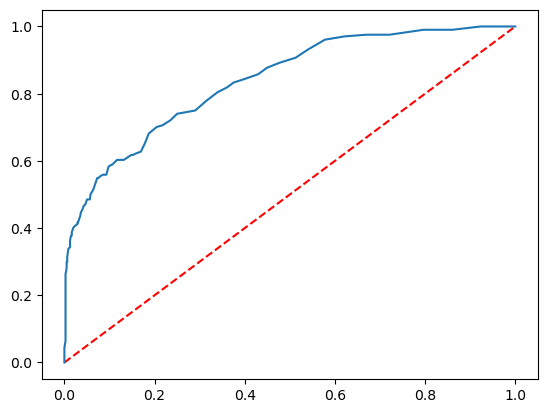

Do You Want To Keep This Model? Yesyes


In [39]:
rf=model_validation(RandomForestClassifier(n_estimators=100),x_train,y_train,x_test,y_test)

classification_report
               precision    recall  f1-score   support

           0       0.87      0.96      0.92       796
           1       0.76      0.45      0.56       204

    accuracy                           0.86      1000
   macro avg       0.82      0.71      0.74      1000
weighted avg       0.85      0.86      0.84      1000



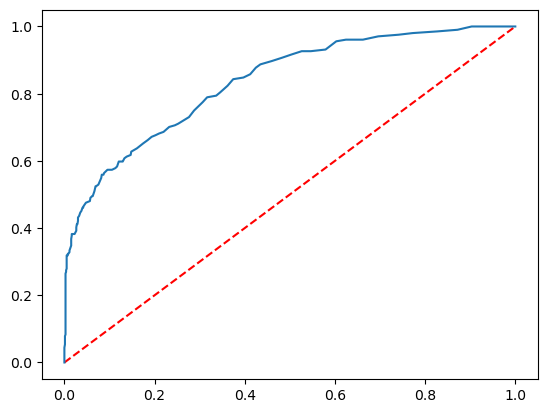

Do You Want To Keep This Model? Yesyes


In [40]:
rf=model_validation(RandomForestClassifier(n_estimators=150),x_train,y_train,x_test,y_test)

In [41]:
df_score

,Model,Accuracy,Recall,Precision,F1 Score
0,DecisionTreeClassifier(max_depth=8),0.851,0.441176,0.720000,0.547112
1,RandomForestClassifier(),0.857,0.436275,0.760684,0.554517
2,RandomForestClassifier(n_estimators=150),0.859,0.446078,0.764706,0.563467


# ADaBoost

classification_report
               precision    recall  f1-score   support

           0       0.87      0.96      0.91       796
           1       0.74      0.44      0.55       204

    accuracy                           0.85      1000
   macro avg       0.81      0.70      0.73      1000
weighted avg       0.84      0.85      0.84      1000



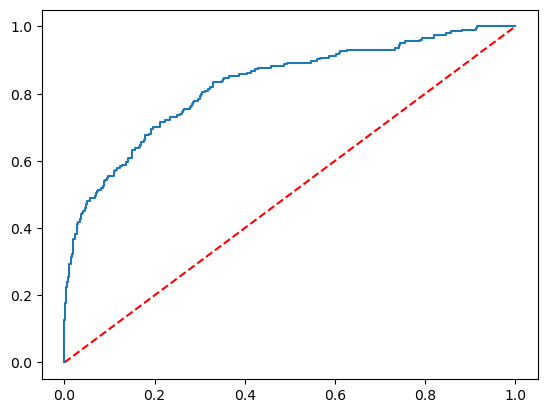

Do You Want To Keep This Model? Yesyes


In [146]:
ada=model_validation(AdaBoostClassifier(n_estimators=150),x_train,y_train,x_test,y_test)

# Gradient Boosting

classification_report
               precision    recall  f1-score   support

           0       0.87      0.95      0.91       796
           1       0.69      0.43      0.53       204

    accuracy                           0.84      1000
   macro avg       0.78      0.69      0.72      1000
weighted avg       0.83      0.84      0.83      1000



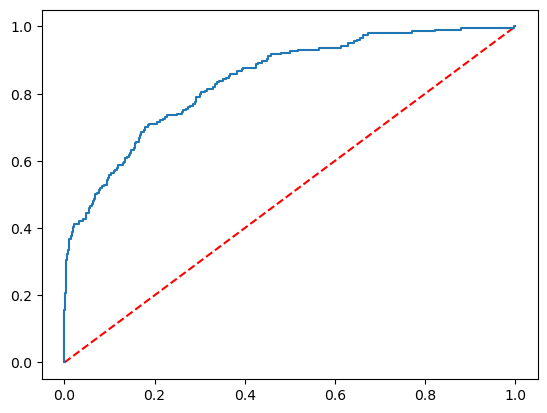

Do You Want To Keep This Model? Yesyes


In [43]:
gbc=model_validation(GradientBoostingClassifier(n_estimators=150,max_depth=7),x_train,y_train,x_test,y_test)

classification_report
               precision    recall  f1-score   support

           0       0.87      0.95      0.90       796
           1       0.67      0.43      0.53       204

    accuracy                           0.84      1000
   macro avg       0.77      0.69      0.71      1000
weighted avg       0.83      0.84      0.83      1000



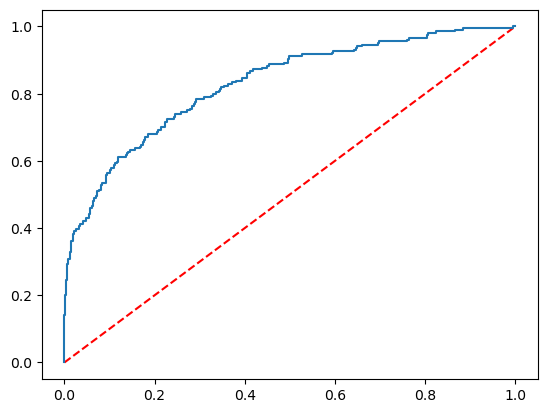

Do You Want To Keep This Model? Yesyes


In [44]:
xgb=model_validation(XGBClassifier(n_estimators=200,max_depth=7),x_train,y_train,x_test,y_test)

# Voting

In [45]:
base_models = [('DT',DecisionTreeClassifier(max_depth=8)),
              ('RF',RandomForestClassifier(n_estimators=150,max_depth=13)),
              ('ADABoost',AdaBoostClassifier(n_estimators=200)),
              ('GB',GradientBoostingClassifier(n_estimators=150,max_depth=10))] 


classification_report
               precision    recall  f1-score   support

           0       0.87      0.96      0.92       796
           1       0.76      0.44      0.56       204

    accuracy                           0.86      1000
   macro avg       0.82      0.70      0.74      1000
weighted avg       0.85      0.86      0.84      1000



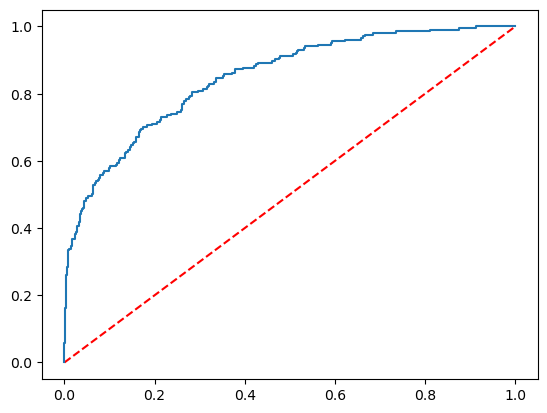

Do You Want To Keep This Model? Yesyes


In [147]:
voting = model_validation(VotingClassifier(estimators=base_models,voting = 'soft'),
                         x_train,y_train,x_test,y_test)

# Stacking

classification_report
               precision    recall  f1-score   support

           0       0.87      0.94      0.90       796
           1       0.66      0.43      0.52       204

    accuracy                           0.84      1000
   macro avg       0.76      0.69      0.71      1000
weighted avg       0.82      0.84      0.83      1000



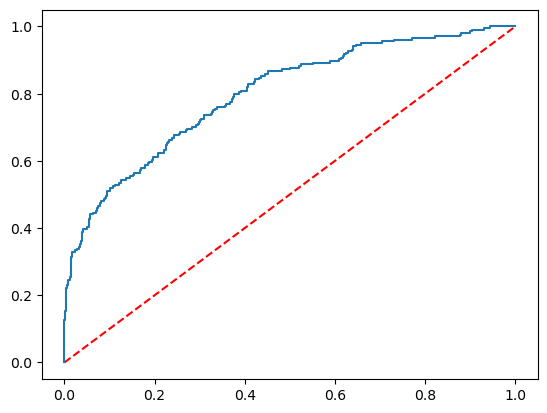

Do You Want To Keep This Model? Yesyes


StackingClassifier(estimators=[('DT', DecisionTreeClassifier(max_depth=8)),
                               ('RF',
                                RandomForestClassifier(max_depth=13,
                                                       n_estimators=150)),
                               ('ADABoost',
                                AdaBoostClassifier(n_estimators=200)),
                               ('GB',
                                GradientBoostingClassifier(max_depth=10,
                                                           n_estimators=150))],
                   final_estimator=XGBClassifier(base_score=None, booster=None,
                                                 callbacks=None,
                                                 colsample_bylevel=None,
                                                 co...
                                                 feature_types=None, gamma=None,
                                                 grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=None,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=10, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 multi_strategy=None,
                                                 n_estimators=150, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 random_state=None, ...))

In [148]:
model_validation(StackingClassifier(estimators=base_models,final_estimator=XGBClassifier(n_estimators=150,max_depth=10)),x_train,y_train,x_test,y_test)

In [52]:
df_score


,Model,Accuracy,Recall,Precision,F1 Score
0,DecisionTreeClassifier(max_depth=8),0.851,0.441176,0.720000,0.547112
1,RandomForestClassifier(),0.857,0.436275,0.760684,0.554517
2,RandomForestClassifier(n_estimators=150),0.859,0.446078,0.764706,0.563467
3,AdaBoostClassifier(n_estimators=150),0.855,0.441176,0.743802,0.553846
4,"GradientBoostingClassifier(max_depth=7, n_esti...",0.844,0.426471,0.690476,0.527273
5,"XGBClassifier(base_score=None, booster=None, c...",0.841,0.431373,0.671756,0.525373
6,"VotingClassifier(estimators=[('DT', DecisionTr...",0.858,0.441176,0.762712,0.559006
7,"StackingClassifier(estimators=[('DT', Decision...",0.847,0.446078,0.694656,0.543284


In [53]:
#Fine Tuning XGBoost
grid={'n_estimators':[100,150,200,300,350],
     'gamma':[0,1,2,3],
     'max_depth':[7,10,13,16,19]}

In [54]:
gscv_xgb=GridSearchCV(estimator=XGBClassifier(),param_grid=grid,scoring='recall',cv=5)

In [55]:
gscv_xgb.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'gamma': [0, 1, 2, 3],
                         'max_depth': [7, 10, 13, 16, 19],
                         'n_estimators': [100, 150, 200, 300, 350]},
             scoring='recall')

In [56]:
gscv_xgb.best_params_

{'gamma': 0, 'max_depth': 16, 'n_estimators': 350}

In [57]:
gscv_xgb.best_score_

0.5019014011107636

# Feature Section

# Final Model

classification_report
               precision    recall  f1-score   support

           0       0.87      0.94      0.90       796
           1       0.66      0.45      0.53       204

    accuracy                           0.84      1000
   macro avg       0.76      0.70      0.72      1000
weighted avg       0.83      0.84      0.83      1000



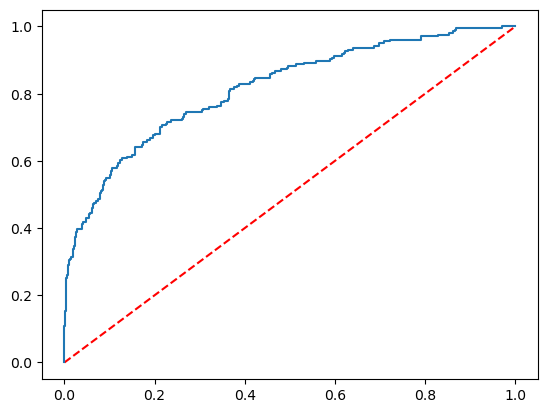

Do You Want To Keep This Model? Yesyes


In [58]:
final_model=model_validation(XGBClassifier(**gscv_xgb.best_params_),x_train,y_train,x_test,y_test)

# Prediction

In [60]:
x_test.head(1)

,CreditScore,Geography,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Gender_Male
5371,712,4522,33,3,153819.58,1,1,0,79176.09,1


In [61]:
geo_encoding

{'France': 4522, 'Germany': 2255, 'Spain': 2223}

In [67]:
final_model.predict(([[675,4522,35,4,120000,2,1,0,60000,0]]))[0]

0

In [68]:
final_model.predict(([[675,2223,35,4,120000,2,1,0,65000,1]]))[0]

0

# Save the fitted model

In [65]:
import pickle

In [66]:
with open('final_model.pkl','wb') as file:
    pickle.dump(final_model,file)